In [1]:
# Results


In [1]:
prediction_path = "/Users/mariusgiger/repos/master/data/aia_171_2012_full_disk_256_cevae_pred/20210202-201759_cevae/predictions/2.jpeg"

In [2]:
img_path = "/Users/mariusgiger/repos/master/data/aia_171_2012_full_disk_256_test/test/2.jpeg"

In [3]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

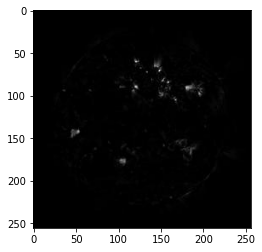

In [4]:
pred_img = Image.open(prediction_path).convert("L")
arr_pred = np.asarray(pred_img)
plt.imshow(arr_pred, cmap='gray', vmin=0, vmax=255)

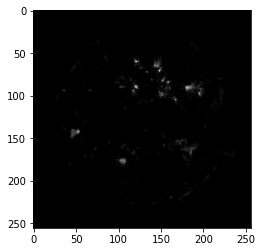

In [5]:
mask_threshold = 5
mask = arr_pred > mask_threshold
sel = np.zeros_like(arr_pred)
sel[mask] = arr_pred[mask]
plt.imshow(sel, cmap='gray', vmin=0, vmax=255)

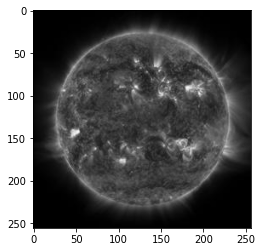

In [6]:
src_img = Image.open(img_path).convert("L")
arr = np.asarray(src_img)
plt.imshow(arr, cmap='gray', vmin=0, vmax=255)

In [12]:
import cv2

cv2_img = cv2.cvtColor(arr, cv2.COLOR_RGB2BGR)

laplacian = cv2.Laplacian(cv2_img, cv2.CV_64F)
sobelx = cv2.Sobel(cv2_img, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(cv2_img, cv2.CV_64F, 0, 1, ksize=3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


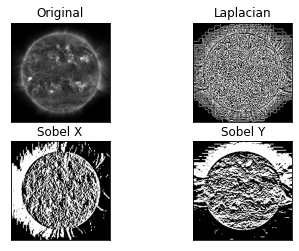

In [13]:
plt.subplot(2,2,1),plt.imshow(cv2_img, cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,2),plt.imshow(laplacian, cmap = 'gray')
plt.title('Laplacian'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,3),plt.imshow(sobelx,cmap = 'gray')
plt.title('Sobel X'), plt.xticks([]), plt.yticks([])
plt.subplot(2,2,4),plt.imshow(sobely,cmap = 'gray')
plt.title('Sobel Y'), plt.xticks([]), plt.yticks([])

plt.show()

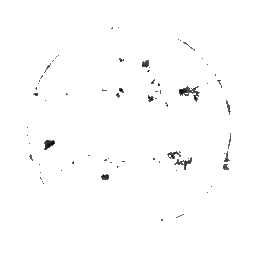

In [65]:
threshmask_img = np.copy(arr)
threshmask = arr < 150
threshmask_img[threshmask] = 0
threshmask_img = Image.fromarray(np.invert(threshmask_img))
threshmask_img

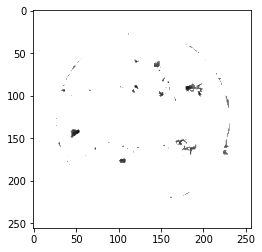

In [80]:
threshmask_img = np.copy(arr)
threshmask = arr < 150
threshmask_img[threshmask] = 0

plt.imshow(np.invert(threshmask_img), cmap='gray', vmin=0, vmax=200)

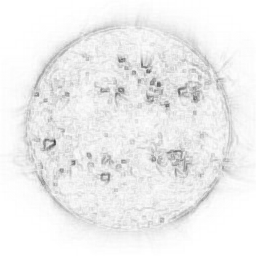

In [57]:
from scipy import ndimage
grad_img = ndimage.morphological_gradient(arr, size=(3,3))
grad_img = Image.fromarray(np.invert(grad_img))
grad_img

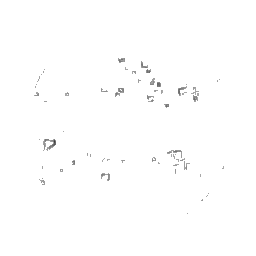

In [62]:
from scipy import ndimage
grad_img = ndimage.morphological_gradient(arr, size=(3,3))
grad_img_mask = grad_img < 85
grad_img[grad_img_mask] = 0
grad_img = Image.fromarray(np.invert(grad_img))
grad_img

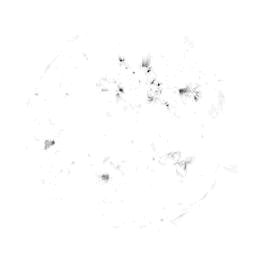

In [38]:
mask_img = Image.fromarray(np.invert(sel))
mask_img

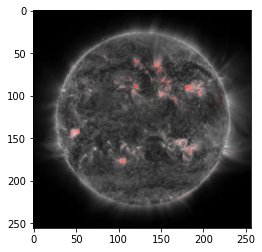

In [41]:
red = Image.new('RGB', (256, 256), color = 'red')

src_img = Image.open(img_path).convert("L")
im = Image.composite(src_img, red, mask_img)
plt.imshow(im, vmin=0, vmax=255)

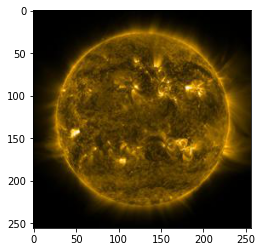

In [33]:
src_img = Image.open(img_path)
arr = np.asarray(src_img)
plt.imshow(arr, cmap='gray', vmin=0, vmax=255)

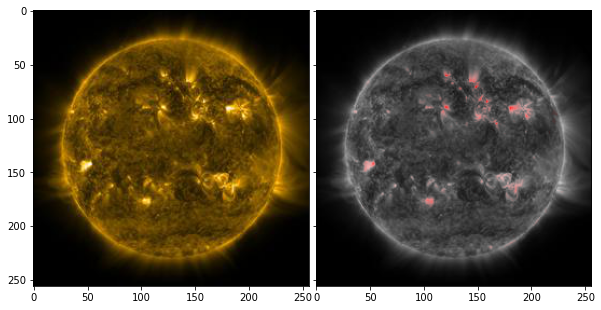

In [34]:
from mpl_toolkits.axes_grid1 import ImageGrid

fig = plt.figure(figsize=(10., 10.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(1, 2),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, i in zip(grid, [arr, im]):
    # Iterating over the grid returns the Axes.
    ax.imshow(i)

In [1]:
output_path = "/Users/mariusgiger/repos/master/data/aia_171_2012_full_disk_256_cevae_pred/20210205-174932_cevae/img"

In [39]:
from pathlib import Path
from PIL import Image
import numpy as np

input_images = list(Path(output_path).rglob(f'Input_000*.png'))
model_images = []

for input_image_path in input_images:
    src_img = Image.open(input_image_path)
    src_img_arr = np.asarray(src_img)
    
    output_image_path = Path(str(input_image_path).replace("Input", "Output"))
    out_img = Image.open(output_image_path)
    output_img_arr = np.asarray(out_img)
    
    pred_image_path = Path(str(input_image_path).replace("Input", "Scores"))
    pred_img = Image.open(pred_image_path)
    pred_img_arr = np.invert(np.asarray(pred_img))
    
    model_images.append((input_image_path.name, (("Input", src_img_arr), ("Anomaly Score", pred_img_arr), ("Reconstruction", output_img_arr))))
    

<ipython-input-56-18b5e57194ab>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(15., 5))


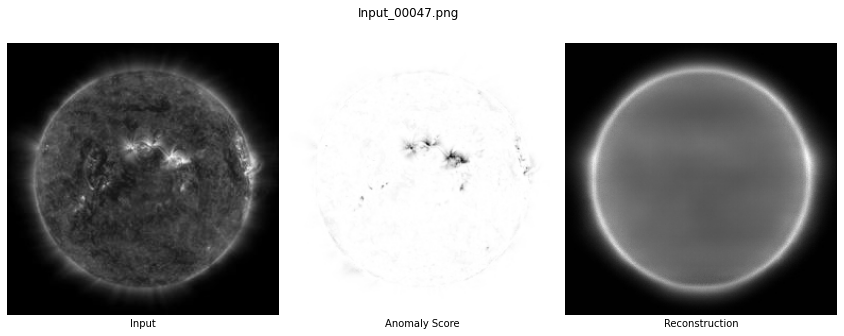

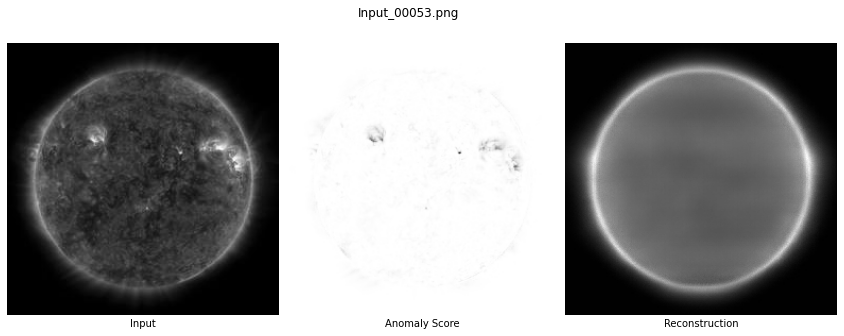

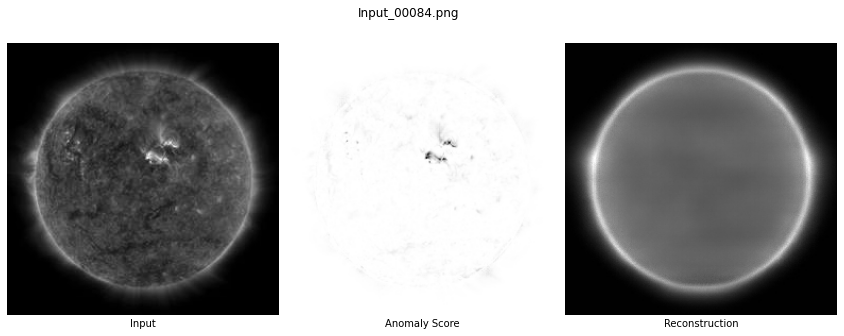

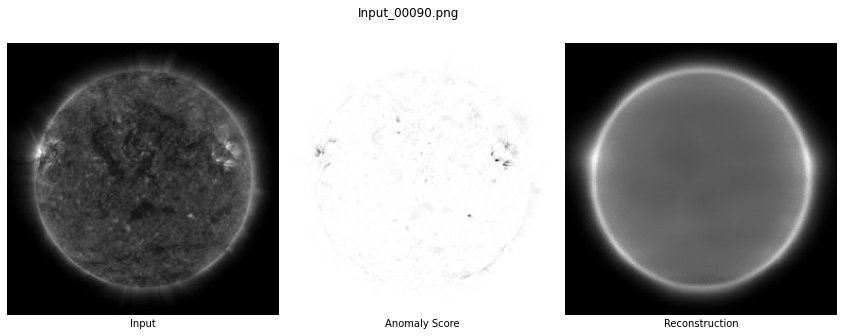

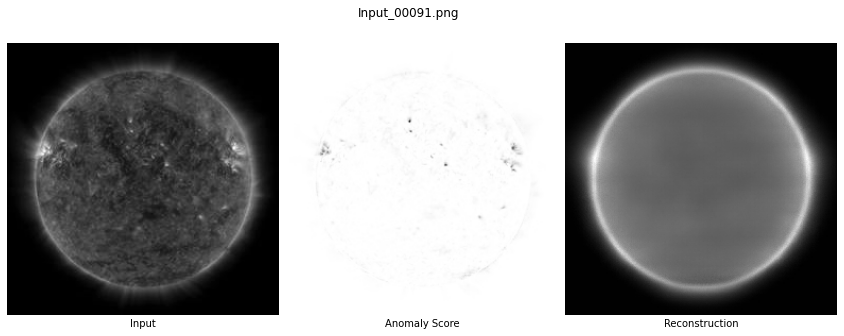

...

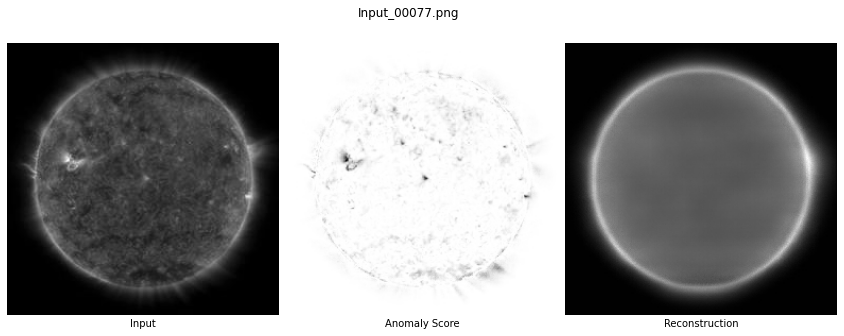

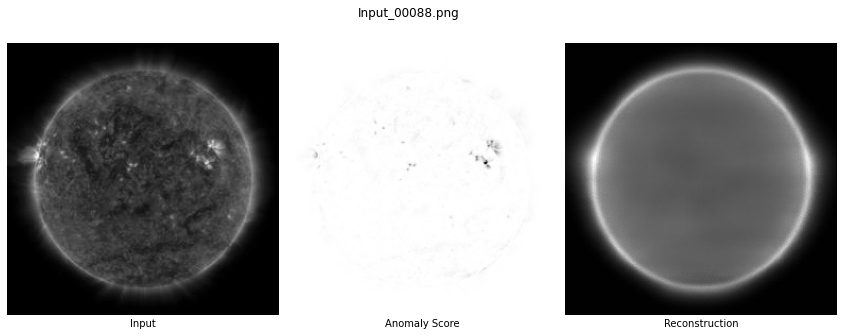

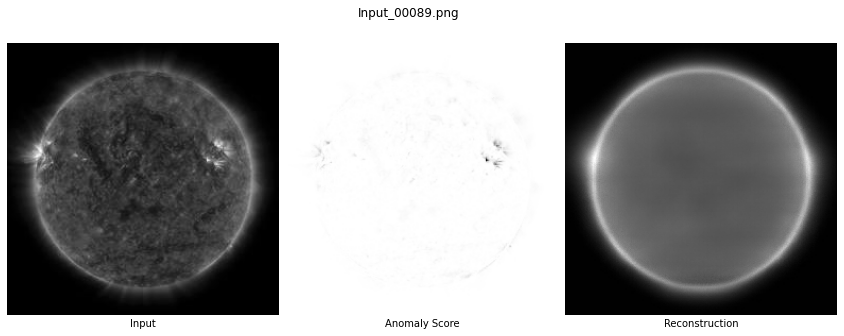

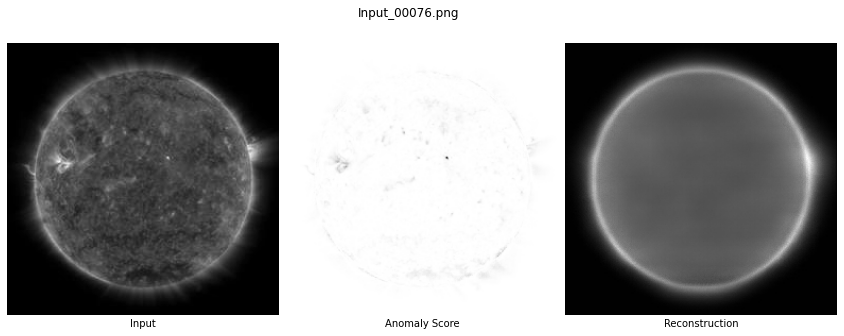

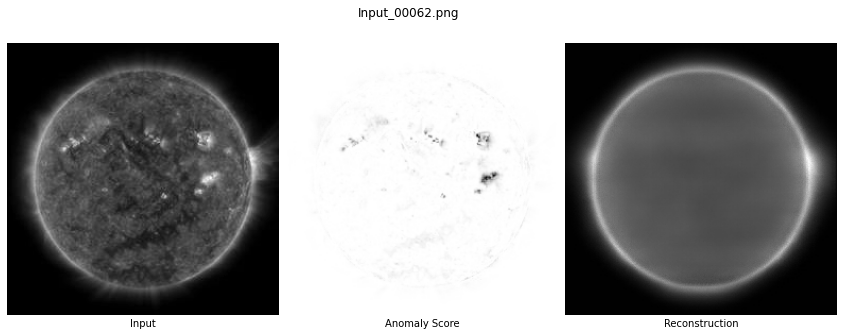

In [56]:
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt


for images in model_images:
    fig = plt.figure(figsize=(15., 5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(1, 3),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )
    
    for ax, i in zip(grid, images[1]):
        # Iterating over the grid returns the Axes.
        ax.imshow(i[1])
        ax.set_xlabel(i[0])
        ax.xaxis.set_ticks([])
        ax.yaxis.set_ticks([])
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
    fig.suptitle(images[0])
        